In [1]:
library('keras')
library('tensorflow')
library('tidyverse')
library('fs')
library('tfdatasets')
library('fields')
library('magick')

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: spam

Spam version 2.10-0 (2023-10-23) is loaded.
Type 'help( Spam)' or 'demo( spam)' for a short introduction 
and overview of this package.
Help for individual functions is also obtained by adding the
suffix '.spam' to the function name, e.g. 'help( chol.spam)'.


Attaching package: ‘spam’


The following objects are masked from ‘package:base’:

    backsolve, forwardsolve


Loading required package: viridisLite


Try help(fields) to get starte

# **Wczytanie danych**

In [2]:
#Przekształcenie formatu
convert_to_supported_format <- function(file_path, output_format = "jpeg") {
  img <- image_read(file_path)
  output_path <- sub("\\.[a-z]+$", paste0(".", output_format), file_path)
  image_write(img, path = output_path, format = output_format)
  return(output_path)
}

image_files_copy <- list.files(path = "/kaggle/input/flood-area-segmentation/Image", full.names = TRUE)

dir.create(file.path("Image"), recursive = TRUE, showWarnings = FALSE)
file.copy(image_files_copy, file.path("Image"))
image_files <- list.files(path = "/kaggle/working/Image", full.names = TRUE)
converted_images <- sapply(image_files, convert_to_supported_format)

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [31] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [46] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [61] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [76] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [91] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[106] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[121] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[136] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[151] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[166] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[181] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[196] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[211] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[226] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[241] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[256] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[271] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[286] TRUE TRUE TRUE TRUE TRUE

In [3]:
input_dir <- "/kaggle/working/Image"
target_dir <- "/kaggle/input/flood-area-segmentation/Mask"

In [4]:
image_paths = tibble(input = dir_ls(input_dir, glob = "*.jpeg"),
       target = dir_ls(target_dir, glob = "*.png"))

<tf.Tensor: shape=(443, 760, 3), dtype=uint8, numpy=…>
<tf.Tensor: shape=(443, 760, 1), dtype=uint8, numpy=…>


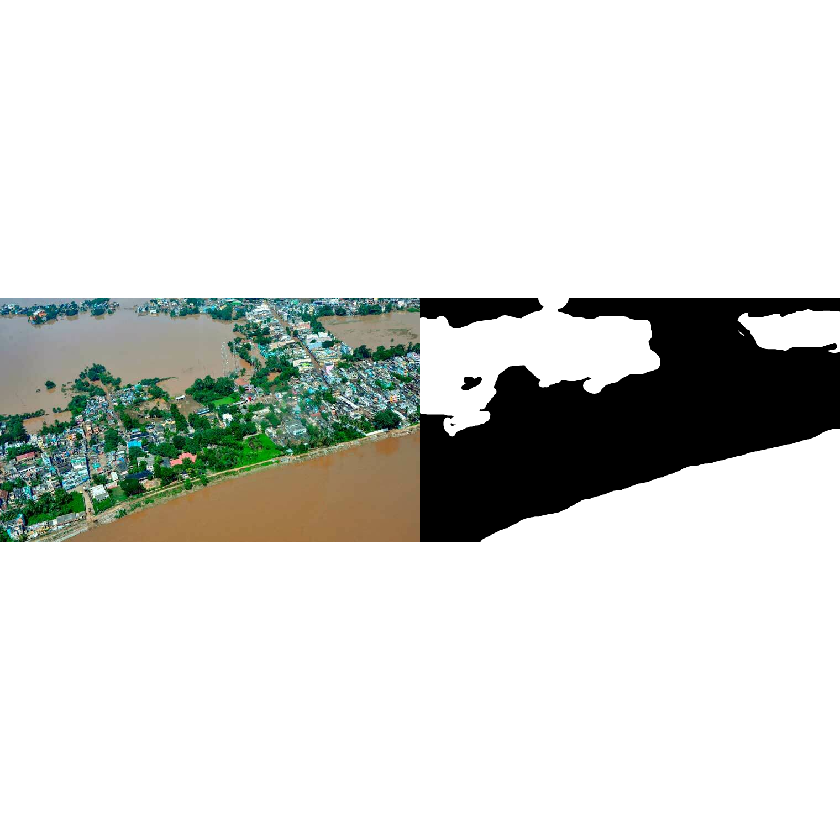

In [5]:
par(mfrow = c(1, 2))
#Imput image
display_image_tensor <- function(x, ..., max = 255,
                                 plot_margins = c(0, 0, 0, 0)) {   
  if(!is.null(plot_margins))
    par(mar = plot_margins)
 
  x %>%
    as.array() %>%
    drop() %>%
    as.raster(max = max) %>%
    plot(..., interpolate = FALSE)
}


image_tensor <- image_paths$input[20] %>% 
   tf$io$read_file() %>%
   tf$io$decode_jpeg()

str(image_tensor)
display_image_tensor(image_tensor)

#Target mask
display_target_tensor <- function(target) display_image_tensor(target)   

target <- image_paths$target[20] %>%
   tf$io$read_file() %>%
   tf$io$decode_png()
str(target)
display_target_tensor(target)

# Przygotowanie danych

In [6]:
tf_read_image <- function(path, format = "image", resize = NULL, ...) {
  img <- path %>%
    tf$io$read_file() %>%
    tf$io[[paste0("decode_", format)]](...)
  
  if (!is.null(resize)) {
    img <- img %>%
      tf$image$resize(as.integer(resize))
  }
  img
}

img_size <- c(256, 256)

tf_read_image_and_resize <- function(..., resize = img_size) {
  tf_read_image(..., resize = resize)
}

# Funkcja do tworzenia datasetu
make_dataset <- function(paths_df) {
  tensor_slices_dataset(paths_df) %>%
    dataset_map(function(path) {
      image <- path$input %>%
        tf_read_image_and_resize("jpeg", channels = 3L)
      target <- path$target %>%
        tf_read_image_and_resize("png", channels = 1L)
      
      # Normalizacja obrazów
      image <- image / 255
      target <- target / 255
      
      list(image, target)
    }) %>%
    dataset_cache() %>%
    dataset_shuffle(buffer_size = nrow(paths_df)) %>%
    dataset_batch(32)
}

# Podzial zbioru

In [7]:
set.seed(20)
train_idx = sample(1:nrow(image_paths), nrow(image_paths)*0.70)

train_paths <- image_paths[train_idx, ]
test_paths <- image_paths[-train_idx, ]
vali_paths = train_paths %>% sample_n(size = nrow(image_paths)*0.15)


train_dataset <- make_dataset(train_paths)
vali_dataset <- make_dataset(vali_paths)
test_dataset <- make_dataset(test_paths)

# U-NET

Opis architektury U-Net

1. **Warstwa wejściowa (Input)**: warstwa która przyjmuje obrazy o określonym rozmiarze input_size.
2. **Koder (Encoder)**:
 Encoder Block 1: Pierwszy blok kodera składa się z dwóch warstw konwolucyjnych z funkcją aktywacji ReLU, zastosowaną w celu ekstrakcji cech z wejściowych obrazów. Po każdej warstwie konwolucyjnej znajduje się warstwa dropout z współczynnikiem 0.1 w celu redukcji overfittingu. Następnie jest warstwa Max Pooling z rozmiarem 2x2, która zmniejsza rozmiar przestrzenny danych wejściowych, co zwiększa efektywność obliczeniową i pomaga w ekstrakcji najważniejszych cech.
Encoder Block 2, 3, 4: Kolejne bloki kodera powtarzają ten sam schemat, zwiększając liczbę filtrów (num_filters) w kolejnych blokach, co pozwala na wykrywanie coraz bardziej abstrakcyjnych cech.
3. **Most (Bridge)** :
Po osiągnięciu najniższego poziomu rozdzielczości przestrzennej, dane przechodzą przez blok mostu, który również składa się z dwóch warstw konwolucyjnych z aktywacją ReLU. Ten fragment sieci służy do łączenia szczegółowych informacji z kodera przed przejściem do dekodera.
4. **Dekoder (Decoder)**:
 Decoder Block 1, 2, 3, 4: Proces dekodowania rozpoczyna się od bloku dekodera, w którym używana jest warstwa konwolucji transponowanej, aby zwiększyć rozmiar przestrzenny danych. Następnie informacje są łączone z odpowiednimi połączeniami pomostowymi (skip connections) z kodera, co pomaga w przywróceniu szczegółów do obrazu. Każdy blok dekodera składa się z dwóch warstw konwolucyjnych z funkcją aktywacji ReLU i warstwy dropout.
5. **Warstwa wyjściowa (Output)**:
Ostatnią warstwą sieci jest warstwa konwolucyjna z jednym filtrem i funkcją aktywacji sigmoidalną, która zwraca przewidywania segmentacji na obrazie. Warstwa ta generuje mapę binarną, gdzie każdy piksel obrazu wejściowego jest przyporządkowany do klasy (np. przedmiotu zainteresowania kontra tło).

In [8]:
conv_block <- function(inputs, num_filters) {
  x <- layer_conv_2d(inputs, filters = num_filters, kernel_size = c(3, 3), activation = "relu", padding = "same")
  x <- layer_dropout(x, rate = 0.1)
  x <- layer_conv_2d(x, filters = num_filters, kernel_size = c(3, 3), activation = "relu", padding = "same")
  return(x)
}

encoder_block <- function(input, num_filters) {
  x <- conv_block(input, num_filters)
  p <- layer_max_pooling_2d(x, pool_size = c(2, 2))
  return(list(x, p))
}

decoder_block <- function(input, skip_features, num_filters) {
  x <- layer_conv_2d_transpose(input, filters = num_filters, kernel_size = c(2, 2), strides = c(2, 2), padding = "same")
  x <- layer_concatenate(list(x, skip_features))
  x <- conv_block(x, num_filters)
  return(x)
}

UNet <- function(input_size) {
  input_layer_nodes <- 16
  input <- layer_input(shape = input_size)

  # Encoder
  encoder1 <- encoder_block(input, input_layer_nodes * 1)
  s1 <- encoder1[[1]]
  p1 <- encoder1[[2]]

  encoder2 <- encoder_block(p1, input_layer_nodes * 2)
  s2 <- encoder2[[1]]
  p2 <- encoder2[[2]]

  encoder3 <- encoder_block(p2, input_layer_nodes * 4)
  s3 <- encoder3[[1]]
  p3 <- encoder3[[2]]

  encoder4 <- encoder_block(p3, input_layer_nodes * 8)
  s4 <- encoder4[[1]]
  p4 <- encoder4[[2]]

  # Bridge
  b1 <- conv_block(p4, input_layer_nodes * 16)

  # Decoder
  d1 <- decoder_block(b1, s4, input_layer_nodes * 8)
  d2 <- decoder_block(d1, s3, input_layer_nodes * 4)
  d3 <- decoder_block(d2, s2, input_layer_nodes * 2)
  d4 <- decoder_block(d3, s1, input_layer_nodes * 1)

  output <- layer_conv_2d(d4, filters = 1, kernel_size = c(1, 1), padding = "same", activation = "sigmoid")

  model <- keras_model(inputs = input, outputs = output, name = "U-Net")
  return(model)
}

**Intersection over Union (IoU) / Jaccard Index**

**IoU** jest jedną z najczęściej stosowanych metryk do oceny segmentacji. Jest to stosunek przecięcia do sumy predykcji i rzeczywistej maski.

In [9]:
iou_metric <- custom_metric("iou", function(y_true, y_pred) {
  y_pred <- k_round(y_pred)
  intersection <- k_sum(y_true * y_pred)
  sum <- k_sum(y_true + y_pred)
  smooth <- 1e-6
  (intersection + smooth) / (sum - intersection + smooth)
})

In [10]:
unet = UNet(c(img_size, 3))
unet %>% compile(optimizer="adam", loss='binary_crossentropy', metrics=c(iou_metric, 'accuracy'))
summary(unet)

Model: "U-Net"
________________________________________________________________________________
 Layer (type)             Output Shape      Param #  Connected to               
 input_1 (InputLayer)     [(None, 256, 256  0        []                         
                          , 3)]                                                 
 conv2d (Conv2D)          (None, 256, 256,  448      ['input_1[0][0]']          
                           16)                                                  
 dropout (Dropout)        (None, 256, 256,  0        ['conv2d[0][0]']           
                           16)                                                  
 conv2d_1 (Conv2D)        (None, 256, 256,  2320     ['dropout[0][0]']          
                           16)                                                  
 max_pooling2d (MaxPoolin  (None, 128, 128,  0       ['conv2d_1[0][0]']         
 g2D)                      16)                                                  
 conv2d_2 (Co

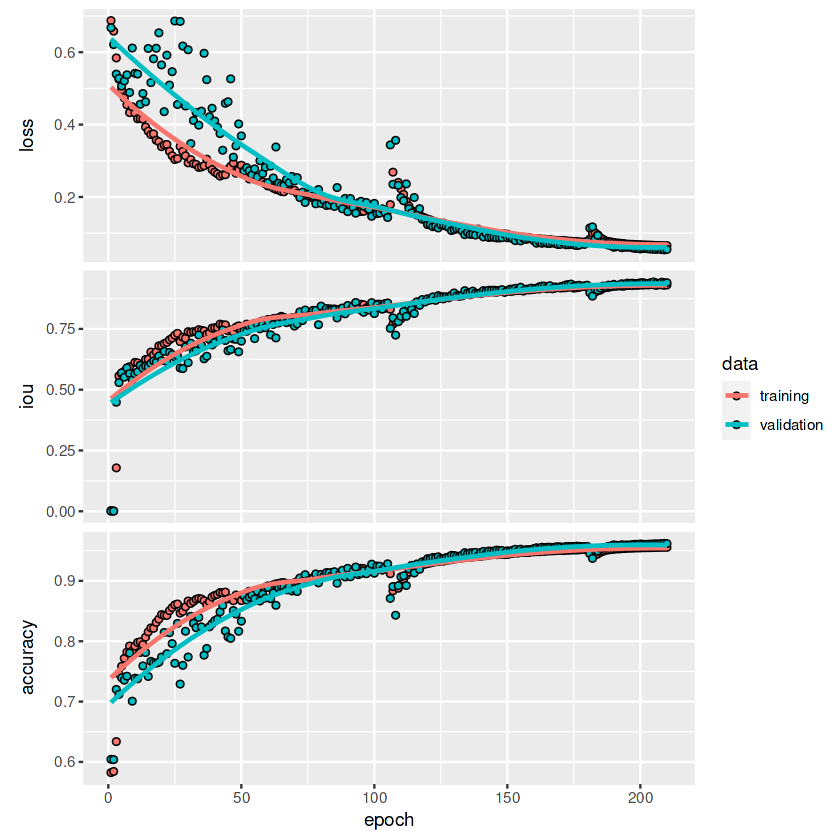

In [11]:
history_unet <- unet %>% fit(
 train_dataset,
 epochs = 210,
 validation_data = vali_dataset)

plot(history_unet)

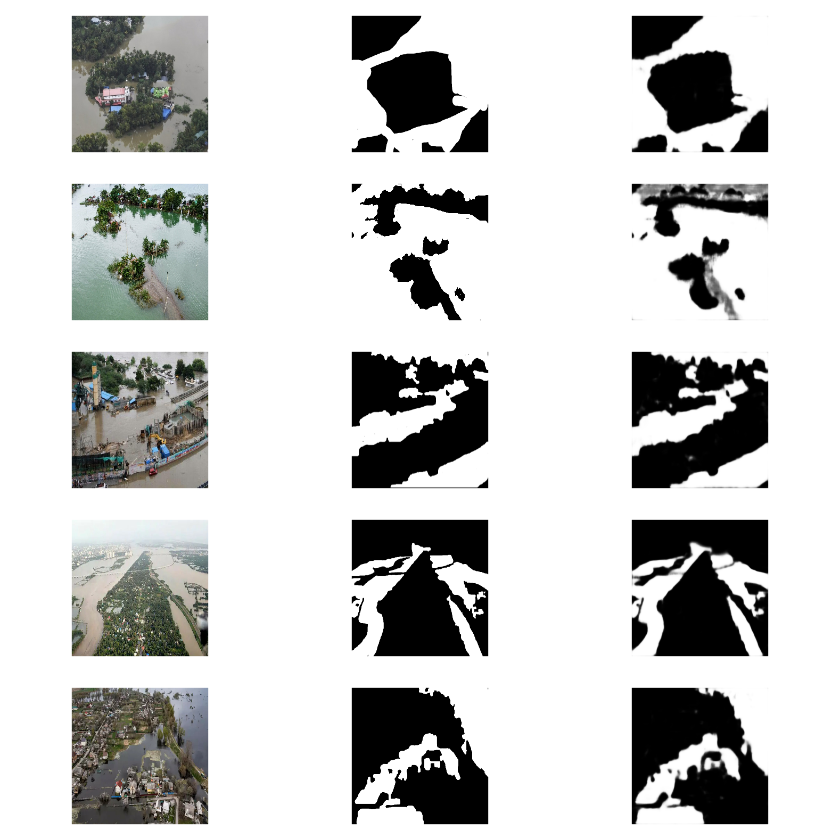

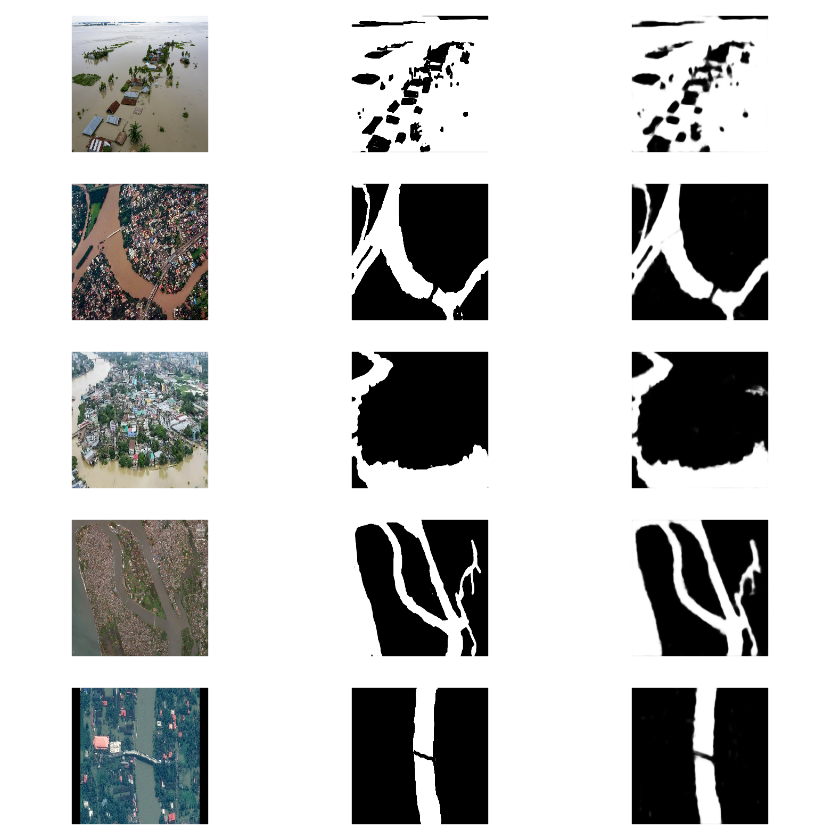

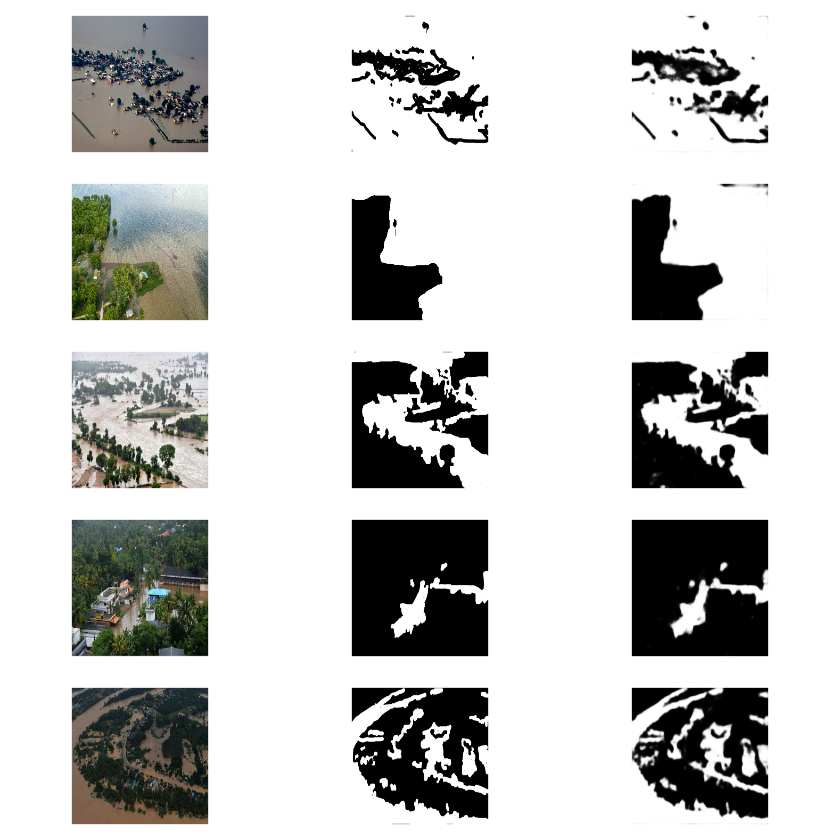

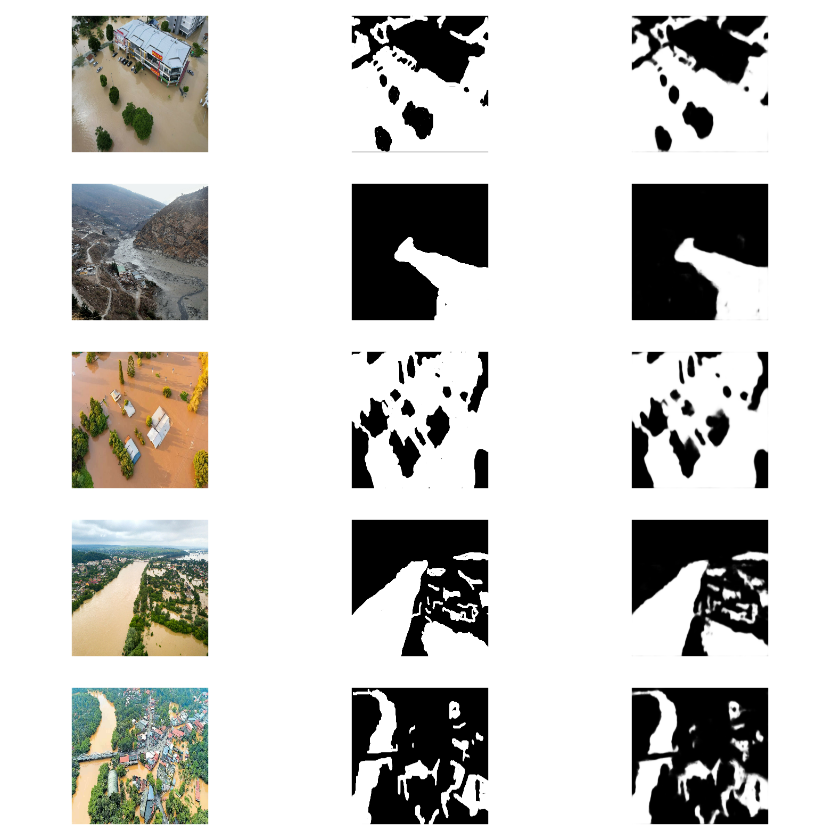

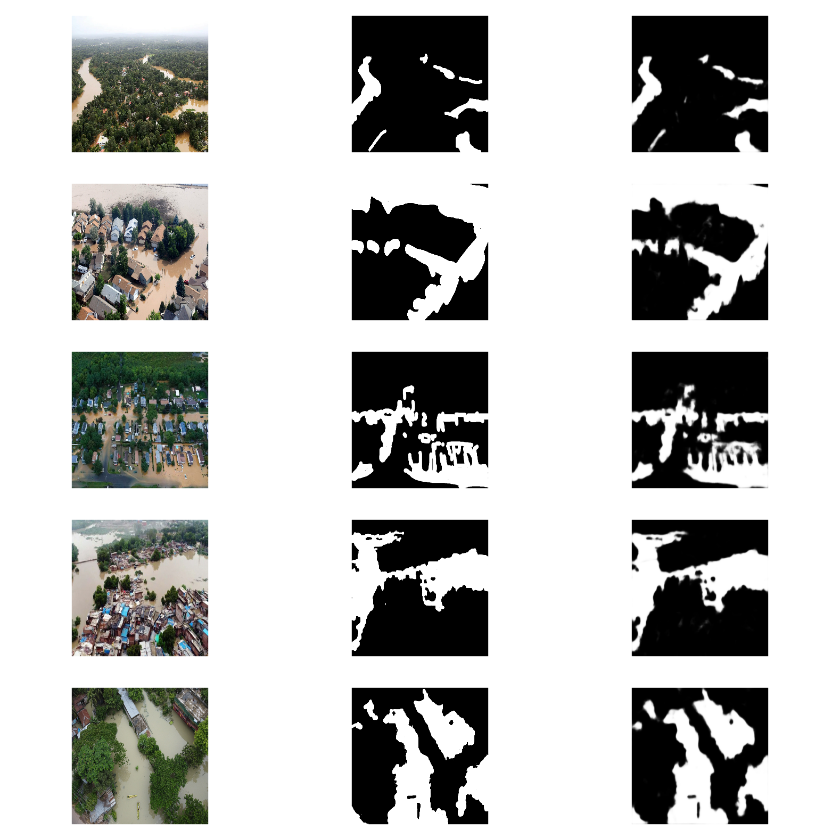

...

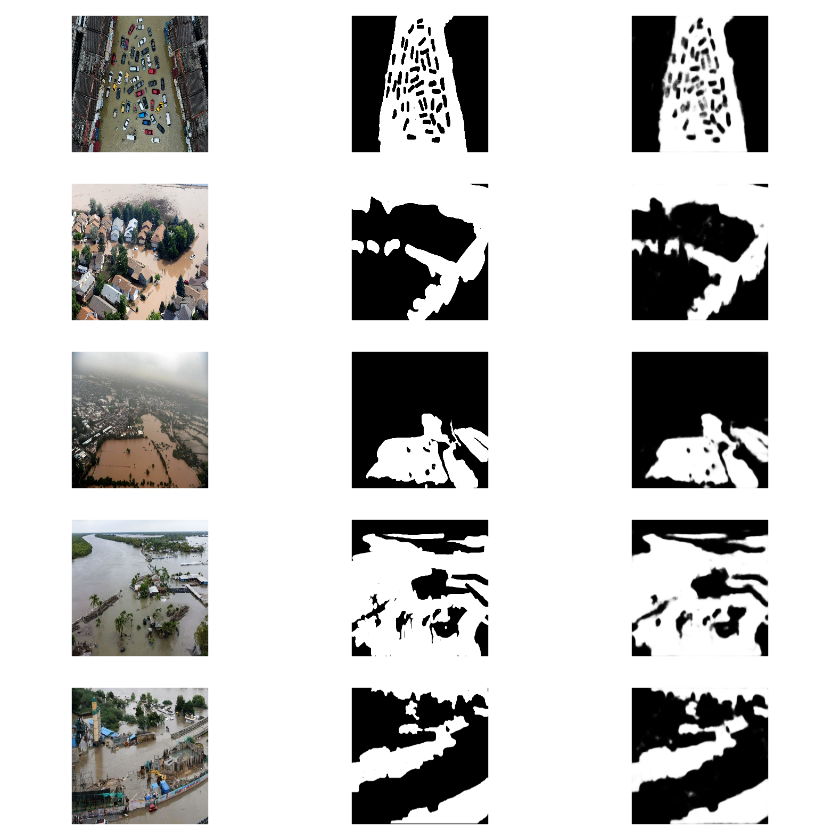

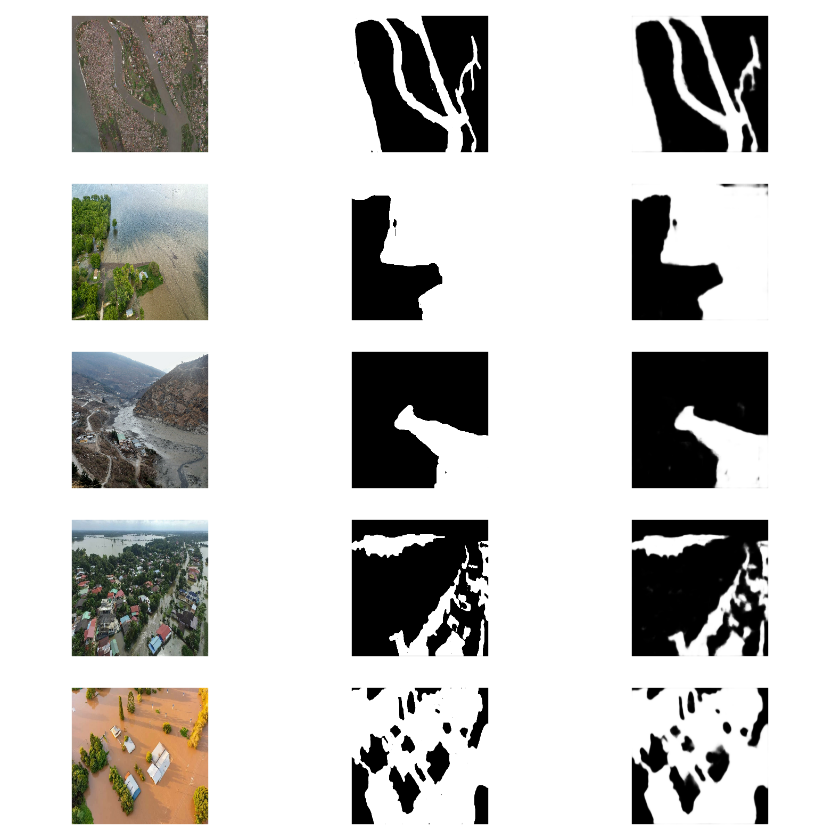

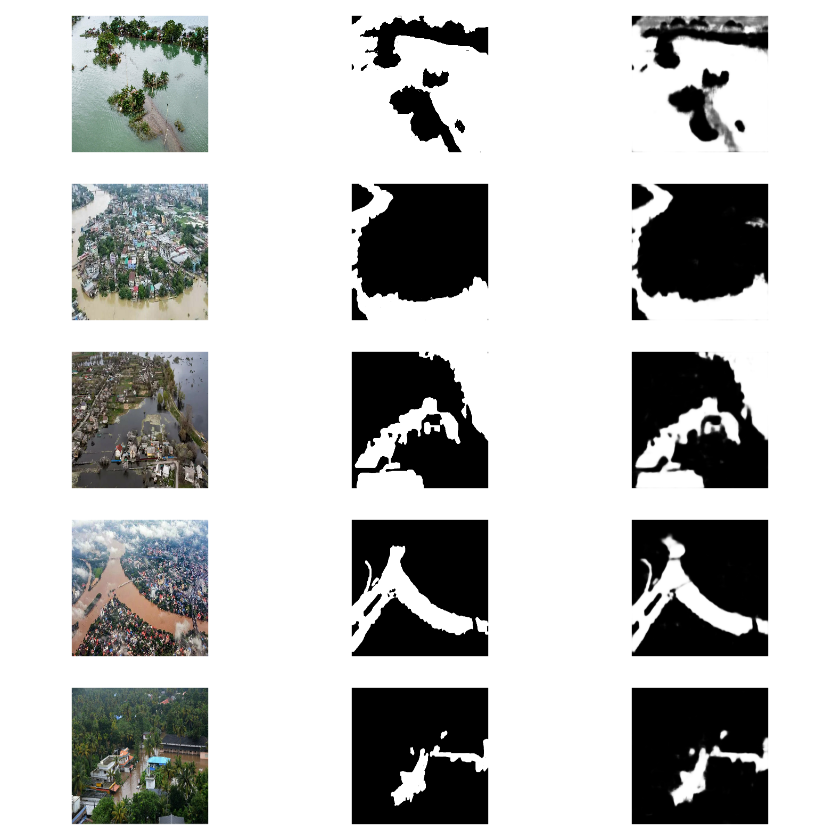

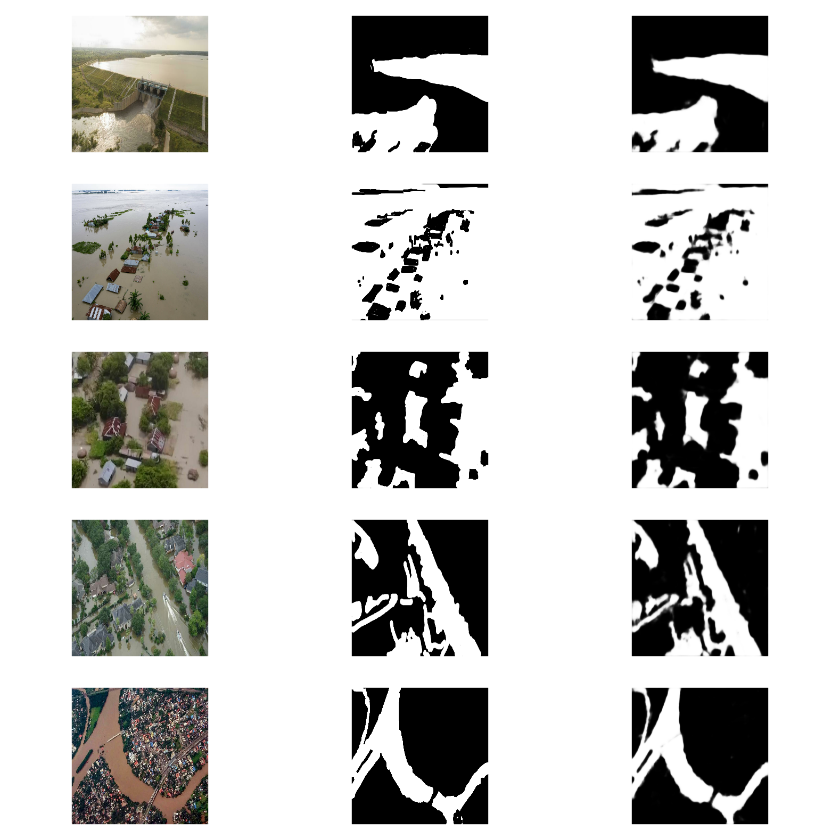

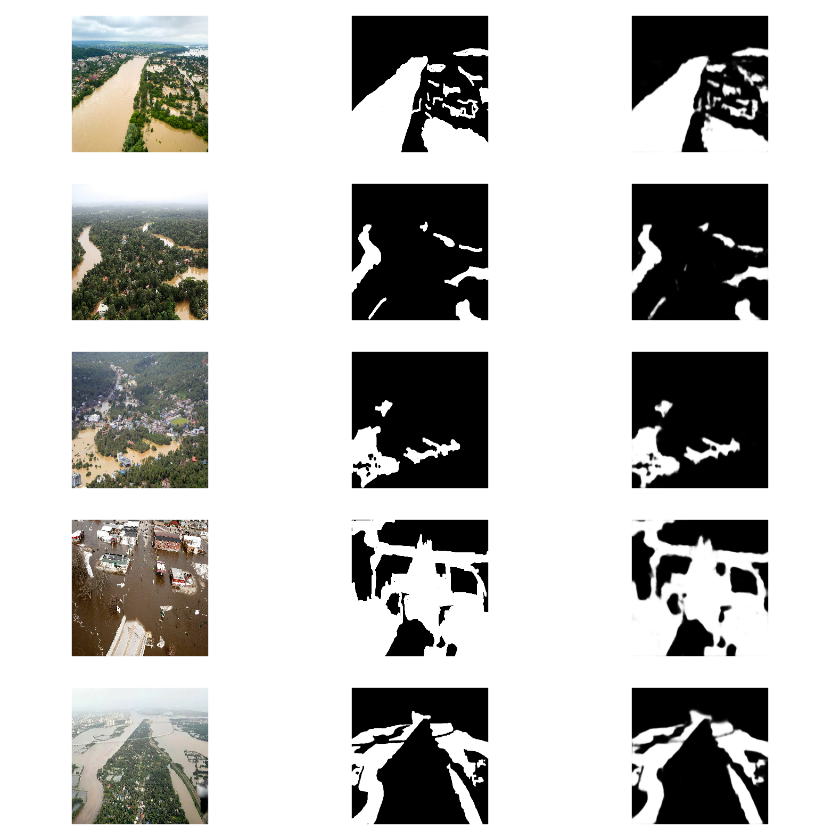

In [12]:
visualize_results <- function(model, dataset, num_images = 5) {
  par(mfrow = c(num_images, 3), mar = c(1, 1, 1, 1))
  
  for (i in 1:num_images) {
    batch <- dataset %>% as_iterator() %>% iter_next()
    images <- batch[[1]]
    true_masks <- batch[[2]]
    pred_masks <- model %>% predict(images)
    
    for (j in 1:dim(images)[1]) {
      image <- images[j,,,]
      true_mask <- true_masks[j,,,]
      pred_mask <- pred_masks[j,,,]
      
      # Ensure true_mask and pred_mask are tensors
      true_mask <- tf$convert_to_tensor(true_mask, dtype=tf$float32)
      pred_mask <- tf$convert_to_tensor(pred_mask, dtype=tf$float32)
      
      # Expand dimensions with integer axis
      true_mask <- tf$expand_dims(true_mask, axis = as.integer(-1))
      pred_mask <- tf$expand_dims(pred_mask, axis = as.integer(-1))
      
      # Tile masks for visualization
      true_mask_rgb <- tf$tile(true_mask, tf$constant(c(1L, 1L, 1L, 3L), dtype = tf$int32))
      pred_mask_rgb <- tf$tile(pred_mask, tf$constant(c( 1L, 1L, 3L), dtype = tf$int32))
      
      # Convert tensor RGB to raster objects
      true_mask_raster <- array(as.numeric(true_mask_rgb), dim=c(dim(true_mask_rgb)[1:2], 3))
      pred_mask_raster <- array(as.numeric(pred_mask_rgb), dim=c(dim(pred_mask_rgb)[1:2], 3))
      
      image <- as.raster(as.array(image))
      
      plot(image, main = "Obraz")
      plot(as.raster(true_mask_raster), main = "Prawdziwa Maska")
      plot(as.raster(pred_mask_raster), main = "Przewidziana Maska")
    }
  }
}

visualize_results(unet, vali_dataset)

In [13]:
pred = unet %>% predict(test_dataset)
unet %>% evaluate(test_dataset)

loss       iou  accuracy 
0.7502154 0.7221262 0.8504527